# Explainability Analysis — SHAP and Grad-CAM

Fraud detection models should not only be accurate — decisions may have practical
consequences (blocking a transaction, rejecting an identity document), so it is
important to understand *why* a model makes a prediction.

**SHAP** (SHapley Additive exPlanations) explains tabular model predictions by
assigning each feature a contribution value for each prediction.

**Grad-CAM** (Gradient-weighted Class Activation Mapping) highlights the regions
of a document image that most influenced the CNN's decision.

| Model type | Method | What it shows |
|---|---|---|
| XGBoost (PaySim) | SHAP TreeExplainer | Global feature importance + per-prediction explanations |
| XGBoost (MM tabular) | SHAP TreeExplainer | Same on multimodal dataset |
| Logistic Regression | SHAP LinearExplainer | Linear feature contributions |
| ResNet-18 / EfficientNet (image-only) | Grad-CAM | Image regions driving fraud prediction |
| Multimodal ResNet-18 / EfficientNet | Grad-CAM on image branch | Image attention within fusion model |


## 0. Setup

In [1]:
import sys, warnings, joblib
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as mpl_cm
from matplotlib.colors import Normalize

import torch
import torch.nn.functional as F
from PIL import Image

warnings.filterwarnings("ignore")
%matplotlib inline
plt.rcParams.update({"figure.dpi": 130, "font.size": 11})

sys.path.insert(0, r"C:\Users\Admin\Desktop\thesis\multimodal-fraud-detection-thesis\src")

PROJECT_ROOT = Path().resolve().parent
DATA_DIR     = PROJECT_ROOT / "data" / "processed"
R_FULL       = PROJECT_ROOT / "results"
R_NB         = PROJECT_ROOT / "notebook" / "results"

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")


Device: cpu


---
# Part 1 — SHAP explanations for tabular models

SHAP assigns each feature a Shapley value for each prediction.
A positive SHAP value pushes the prediction towards fraud; negative towards legitimate.
TreeSHAP (for XGBoost) computes exact Shapley values in polynomial time.
LinearExplainer (for LR) uses the closed-form linear solution.


## 1.1 Helper — extract features and model from sklearn Pipeline

In [2]:
def extract_pipeline_parts(model):
    """
    Extract (preprocessor, classifier, feature_names) from a sklearn Pipeline.
    Works for both LR and XGBoost pipelines.
    """
    steps = dict(model.named_steps)

    # Find preprocessor
    pre = steps.get("preprocessor") or steps.get("columntransformer")

    # Find classifier (last step)
    clf_key = [k for k in steps if k not in ("preprocessor","columntransformer",
                                               "smote","over_sampler")]
    clf = steps[clf_key[-1]]

    # Feature names from ColumnTransformer
    try:
        raw_names = pre.get_feature_names_out()
        feature_names = [n.split("__")[-1] for n in raw_names]
    except Exception:
        feature_names = [f"feature_{i}" for i in range(100)]

    return pre, clf, feature_names

print("Helper ready.")


Helper ready.


## 1.2 SHAP — XGBoost on full PaySim (best model: XGB-FE-SMOTE)

In [3]:
import shap
shap.initjs()

# Load best PaySim model
model_xgb_paysim = joblib.load(R_FULL / "xgb_fe_smote" / "fe_smote_model.joblib")

# Load test data
from tabular_xgboost_utils import prepare_dataframes, build_preprocessor

paysim_test = pd.read_csv(DATA_DIR / "paysim_test.csv")
paysim_train = pd.read_csv(DATA_DIR / "paysim_train.csv")
paysim_val   = pd.read_csv(DATA_DIR / "paysim_val.csv")

data_fe = prepare_dataframes(paysim_train, paysim_val, paysim_test,
                              use_feature_engineering=True)
X_test_fe = data_fe["X_test"]
y_test_fe  = data_fe["y_test"]

pre, xgb_clf, feature_names = extract_pipeline_parts(model_xgb_paysim)

# Transform test data for SHAP (need raw array, not pipeline)
X_test_transformed = pre.transform(X_test_fe)
if hasattr(X_test_transformed, "toarray"):
    X_test_transformed = X_test_transformed.toarray()

print("Feature names:", feature_names)
print("X_test shape:", X_test_transformed.shape)


Feature names: ['step', 'amount', 'oldbalanceOrg', 'newbalanceOrig', 'oldbalanceDest', 'newbalanceDest', 'isFlaggedFraud', 'balance_delta_orig', 'balance_delta_dest', 'amount_to_balance_ratio', 'orig_balance_zeroed', 'type_0', 'type_1', 'type_2', 'type_3', 'type_4']
X_test shape: (1272524, 16)


In [4]:
# TreeSHAP — fast exact explanations for XGBoost
explainer_xgb = shap.TreeExplainer(xgb_clf)

# Use a stratified sample for speed (full dataset is 1.2M rows)
rng = np.random.default_rng(42)
sample_idx = np.concatenate([
    rng.choice(np.where(y_test_fe == 0)[0], size=500, replace=False),
    rng.choice(np.where(y_test_fe == 1)[0], size=500, replace=False),
])
X_sample = X_test_transformed[sample_idx]

print("Computing SHAP values for sample of 1000 test rows...")
shap_values_xgb = explainer_xgb.shap_values(X_sample)
print("Done. Shape:", shap_values_xgb.shape)


Computing SHAP values for sample of 1000 test rows...
Done. Shape: (1000, 16)


### SHAP summary plot — XGBoost PaySim (global feature importance)

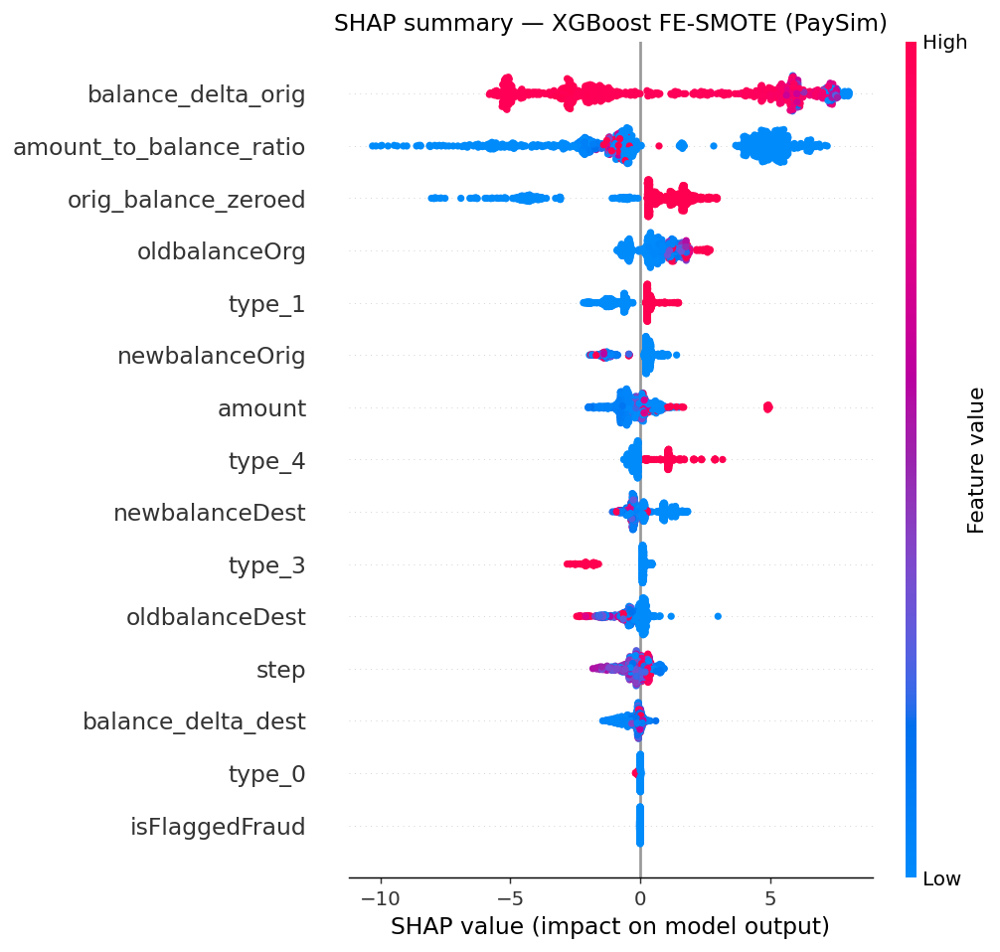

In [5]:
plt.figure(figsize=(10, 6))
shap.summary_plot(
    shap_values_xgb, X_sample,
    feature_names=feature_names,
    plot_type="dot",
    max_display=15,
    show=False,
)
plt.title("SHAP summary — XGBoost FE-SMOTE (PaySim)", fontsize=13)
plt.tight_layout()
plt.savefig(R_NB / "shap_xgb_paysim_summary.png", dpi=150, bbox_inches="tight")
plt.show()


**How to read:** Each row is a feature. Each dot is one sample.
Colour = feature value (red=high, blue=low). X-axis = SHAP value (impact on fraud prediction).
Dots to the right push the prediction towards fraud; dots to the left towards legitimate.


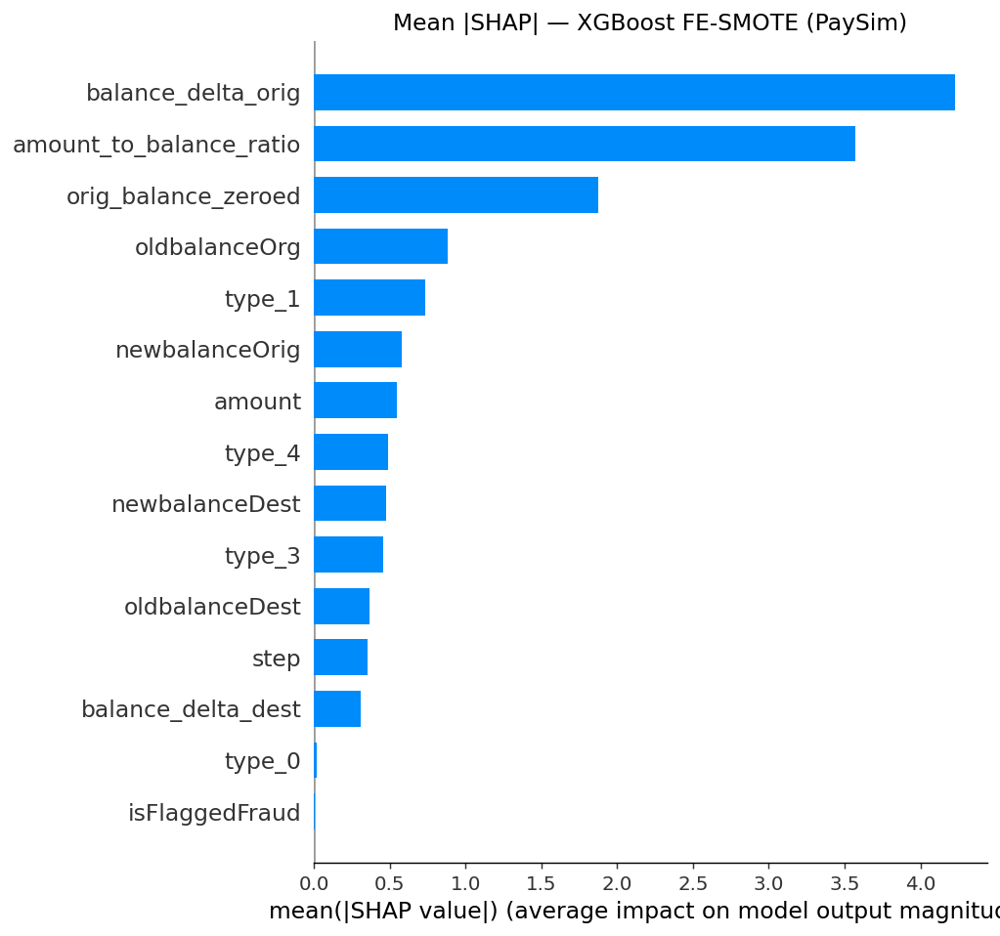

In [6]:
# SHAP bar plot — mean absolute importance
plt.figure(figsize=(9, 5))
shap.summary_plot(
    shap_values_xgb, X_sample,
    feature_names=feature_names,
    plot_type="bar",
    max_display=15,
    show=False,
)
plt.title("Mean |SHAP| — XGBoost FE-SMOTE (PaySim)", fontsize=13)
plt.tight_layout()
plt.savefig(R_NB / "shap_xgb_paysim_bar.png", dpi=150, bbox_inches="tight")
plt.show()


### SHAP waterfall plot — individual fraud prediction

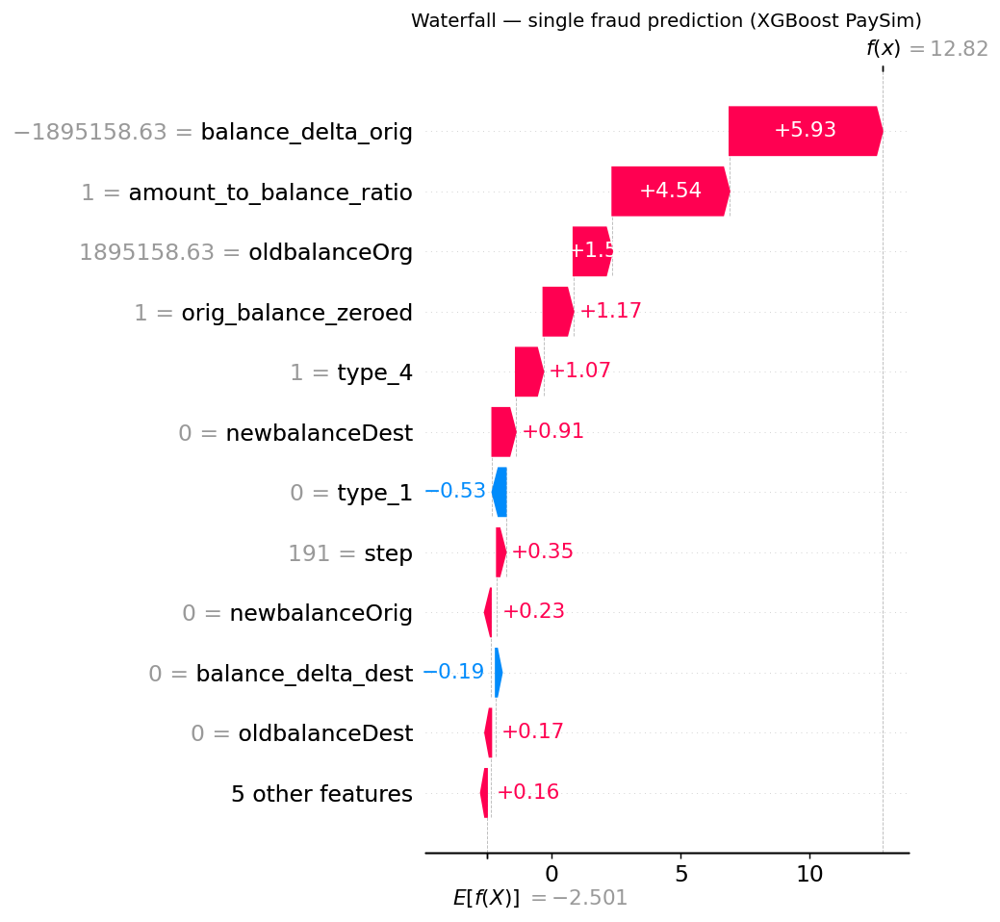

In [7]:
# Pick a correctly classified fraud case
fraud_indices = np.where(y_test_fe.values[sample_idx] == 1)[0]
example_idx   = fraud_indices[0]

explanation = shap.Explanation(
    values    = shap_values_xgb[example_idx],
    base_values = explainer_xgb.expected_value,
    data      = X_sample[example_idx],
    feature_names = feature_names,
)

plt.figure(figsize=(10, 5))
shap.waterfall_plot(explanation, max_display=12, show=False)
plt.title("Waterfall — single fraud prediction (XGBoost PaySim)", fontsize=11)
plt.tight_layout()
plt.savefig(R_NB / "shap_xgb_paysim_waterfall_fraud.png", dpi=150, bbox_inches="tight")
plt.show()


### SHAP waterfall plot — individual legitimate prediction

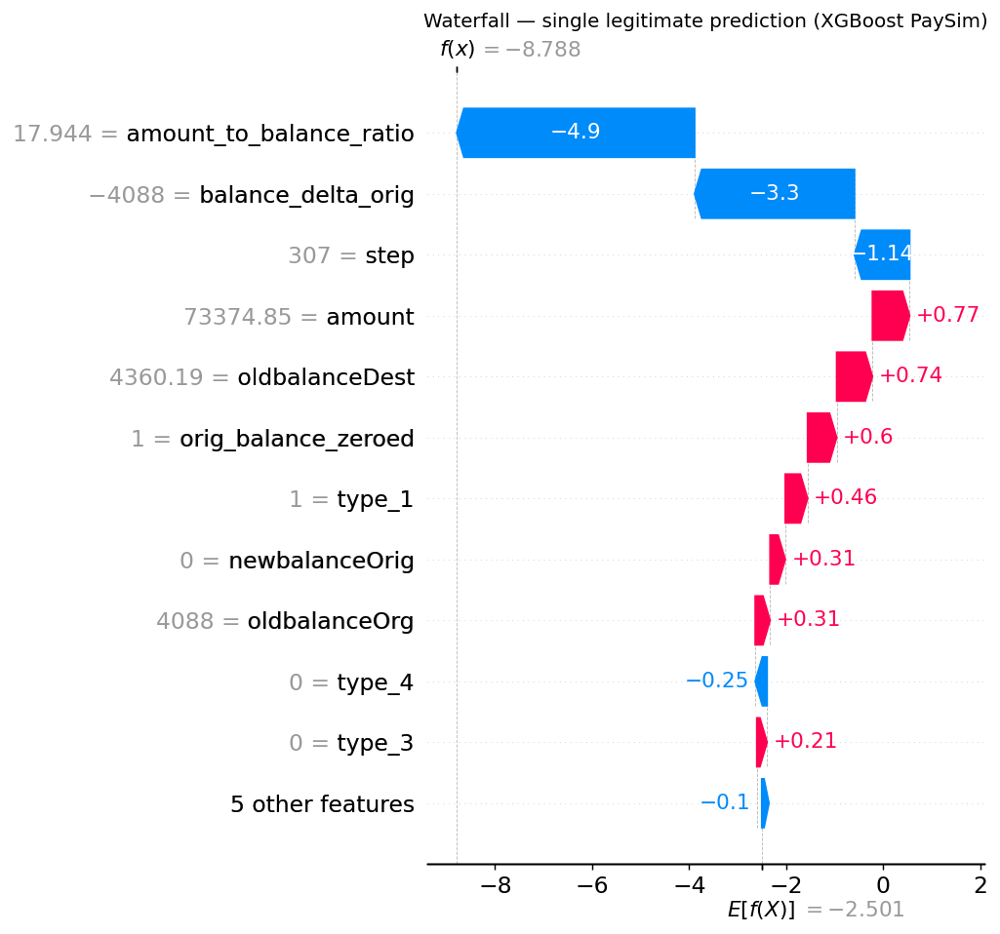

In [8]:
legit_indices = np.where(y_test_fe.values[sample_idx] == 0)[0]
example_idx_l = legit_indices[0]

explanation_l = shap.Explanation(
    values    = shap_values_xgb[example_idx_l],
    base_values = explainer_xgb.expected_value,
    data      = X_sample[example_idx_l],
    feature_names = feature_names,
)

plt.figure(figsize=(10, 5))
shap.waterfall_plot(explanation_l, max_display=12, show=False)
plt.title("Waterfall — single legitimate prediction (XGBoost PaySim)", fontsize=11)
plt.tight_layout()
plt.savefig(R_NB / "shap_xgb_paysim_waterfall_legit.png", dpi=150, bbox_inches="tight")
plt.show()


### SHAP dependence plot — top feature

<Figure size 1040x650 with 0 Axes>

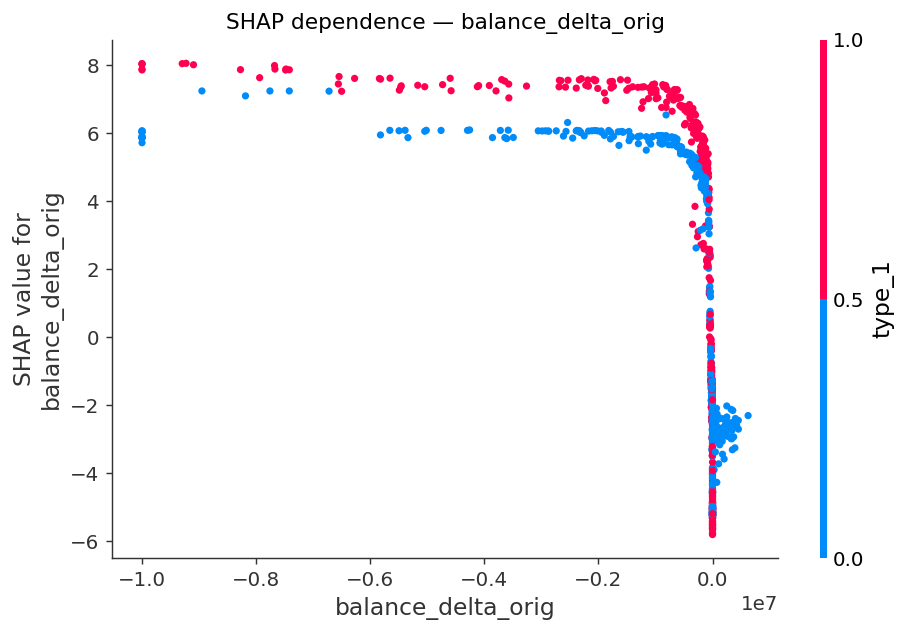

Top feature: balance_delta_orig


In [9]:
# Dependence plot for the most important feature (balance_delta_orig)
top_feature = feature_names[np.abs(shap_values_xgb).mean(0).argmax()]
top_idx     = feature_names.index(top_feature)

plt.figure(figsize=(8, 5))
shap.dependence_plot(
    top_idx, shap_values_xgb, X_sample,
    feature_names=feature_names,
    show=False,
)
plt.title(f"SHAP dependence — {top_feature}", fontsize=12)
plt.tight_layout()
plt.savefig(R_NB / "shap_xgb_paysim_dependence.png", dpi=150, bbox_inches="tight")
plt.show()
print(f"Top feature: {top_feature}")


## 1.3 SHAP — XGBoost on MM tabular dataset (best model)

In [10]:
# Load best MM XGBoost model (B_smote — engineered features)
model_xgb_mm = joblib.load(R_NB / "mm_tabular_xgboost" / "B_smote" / "B_smote_model.joblib")

# Load MM test data
train_mm = pd.read_csv(DATA_DIR / "mm_train_mixed_all_group_test.csv")
test_mm  = pd.read_csv(DATA_DIR / "mm_test_mixed_all_group_test.csv")

from mm_tabular_utils import (
    TARGET_COL, FE_COLS, NUMERIC_FE, CAT_COLS,
    engineer_features, validate_features,
)

test_mm_fe  = engineer_features(test_mm)
X_test_mm   = test_mm_fe[FE_COLS]
y_test_mm   = test_mm_fe[TARGET_COL]

pre_mm, xgb_mm_clf, feat_names_mm = extract_pipeline_parts(model_xgb_mm)
X_test_mm_t = pre_mm.transform(X_test_mm)
if hasattr(X_test_mm_t, "toarray"):
    X_test_mm_t = X_test_mm_t.toarray()

print("MM features:", feat_names_mm)
print("Shape:", X_test_mm_t.shape)


MM features: ['tab_step', 'tab_amount', 'tab_oldbalanceOrg', 'tab_newbalanceOrig', 'tab_oldbalanceDest', 'tab_newbalanceDest', 'tab_isFlaggedFraud', 'tab_balance_delta_orig', 'tab_balance_delta_dest', 'tab_amount_ratio_orig', 'tab_amount_ratio_dest', 'tab_orig_balance_zeroed', 'tab_type_0', 'tab_type_1', 'tab_type_2', 'tab_type_3', 'tab_type_4']
Shape: (1474, 17)


In [11]:
explainer_mm = shap.TreeExplainer(xgb_mm_clf)
shap_values_mm = explainer_mm.shap_values(X_test_mm_t)
print("SHAP values shape:", shap_values_mm.shape)


SHAP values shape: (1474, 17)


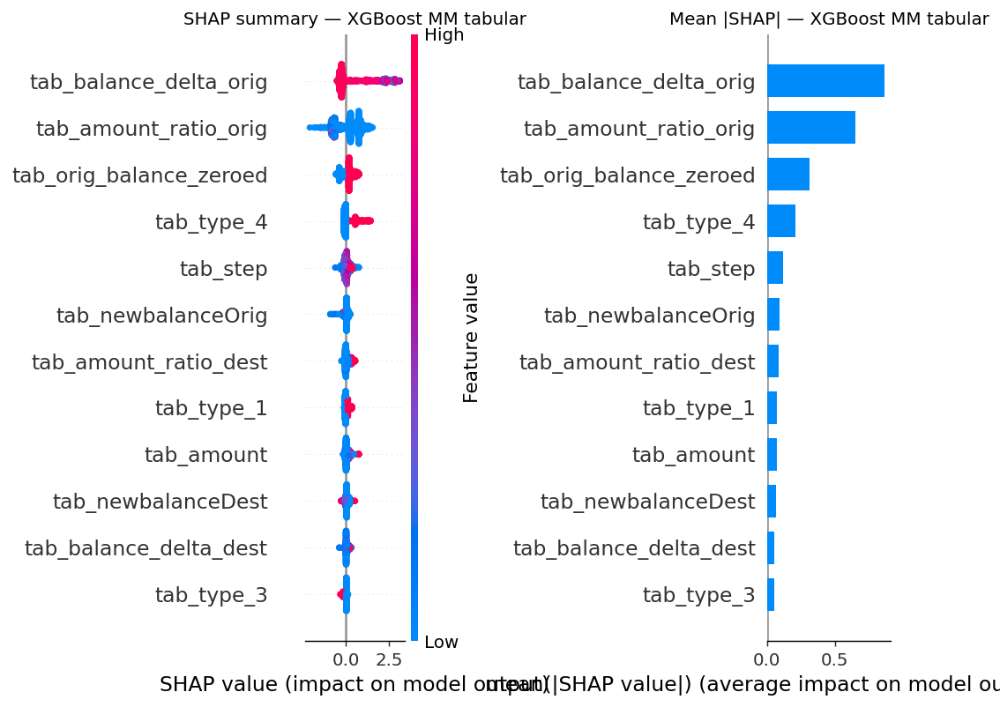

In [12]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

plt.sca(axes[0])
shap.summary_plot(shap_values_mm, X_test_mm_t, feature_names=feat_names_mm,
                  plot_type="dot", max_display=12, show=False)
axes[0].set_title("SHAP summary — XGBoost MM tabular", fontsize=11)

plt.sca(axes[1])
shap.summary_plot(shap_values_mm, X_test_mm_t, feature_names=feat_names_mm,
                  plot_type="bar", max_display=12, show=False)
axes[1].set_title("Mean |SHAP| — XGBoost MM tabular", fontsize=11)

fig.tight_layout()
fig.savefig(R_NB / "shap_xgb_mm_summary.png", dpi=150, bbox_inches="tight")
plt.show()


## 1.4 SHAP — Logistic Regression on full PaySim (comparison)

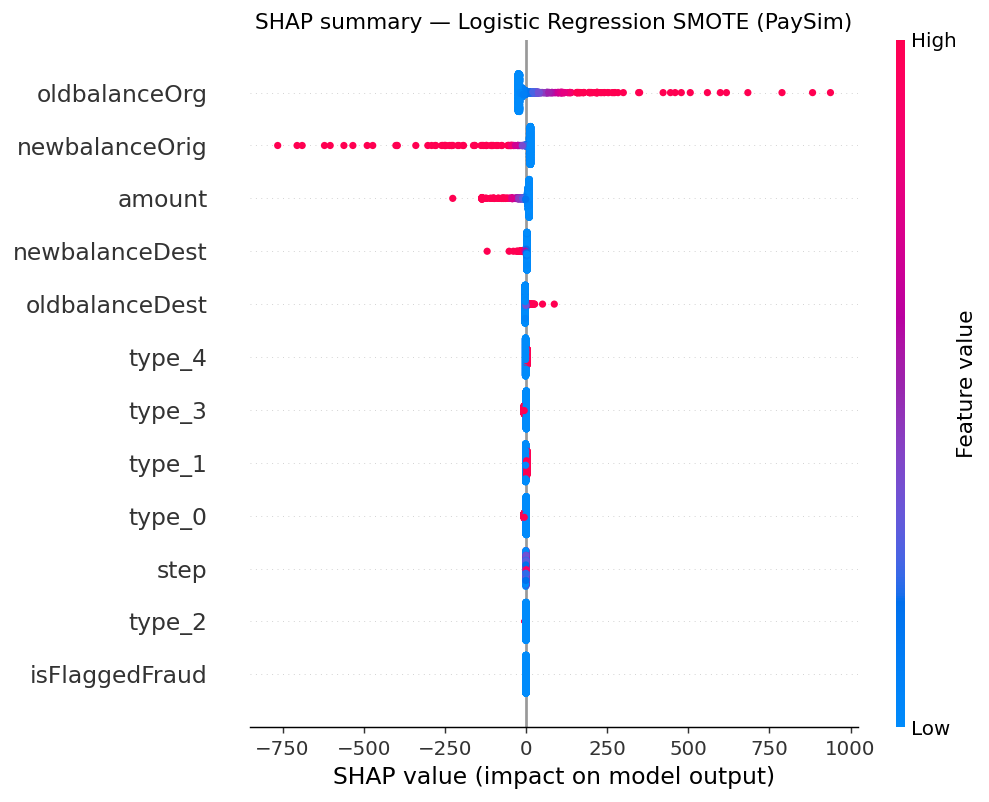

In [13]:
from tabular_baseline_utils import prepare_dataframes as prepare_lr

model_lr = joblib.load(R_FULL / "tabular_full_baseline_smote" / "smote_model.joblib")

data_lr   = prepare_lr(paysim_train, paysim_val, paysim_test)
X_test_lr = data_lr["X_test"]
y_test_lr = data_lr["y_test"]

pre_lr, lr_clf, feat_names_lr = extract_pipeline_parts(model_lr)
X_test_lr_t = pre_lr.transform(X_test_lr)
if hasattr(X_test_lr_t, "toarray"):
    X_test_lr_t = X_test_lr_t.toarray()

# LinearExplainer — fast for LR
# Use same 1000-sample balanced subset
X_lr_sample = X_test_lr_t[sample_idx]

explainer_lr = shap.LinearExplainer(lr_clf, X_lr_sample)
shap_values_lr = explainer_lr.shap_values(X_lr_sample)

plt.figure(figsize=(10, 5))
shap.summary_plot(shap_values_lr, X_lr_sample,
                  feature_names=feat_names_lr,
                  plot_type="dot", max_display=12, show=False)
plt.title("SHAP summary — Logistic Regression SMOTE (PaySim)", fontsize=12)
plt.tight_layout()
plt.savefig(R_NB / "shap_lr_paysim_summary.png", dpi=150, bbox_inches="tight")
plt.show()


**LR vs XGBoost comparison:** The LR SHAP plot shows a simpler, more linear pattern.
Each feature's contribution varies smoothly with its value — reflecting the linear model boundary.
XGBoost SHAP values show richer, non-linear patterns with interaction effects between features.


---
# Part 2 — Grad-CAM for image-only models

Grad-CAM computes a weighted combination of feature maps at the last convolutional
layer, using the gradients of the class score with respect to those feature maps.
The resulting heatmap highlights image regions that most influenced the prediction.

High activation (red in the heatmap) = region pushed prediction towards fraud.
Low activation (blue) = region pushed prediction towards legitimate.


In [14]:
class GradCAM:
    """
    Generic Grad-CAM implementation.
    Works with any CNN that has a named target layer.
    """
    def __init__(self, model, target_layer):
        self.model        = model
        self.activations  = None
        self.gradients    = None

        target_layer.register_forward_hook(self._save_activation)
        target_layer.register_full_backward_hook(self._save_gradient)

    def _save_activation(self, module, inp, out):
        self.activations = out.detach()

    def _save_gradient(self, module, grad_in, grad_out):
        self.gradients = grad_out[0].detach()

    def generate(self, input_tensor):
        """
        Returns normalised Grad-CAM heatmap (H×W numpy array, values 0–1).
        """
        self.model.eval()
        out = self.model(input_tensor)

        self.model.zero_grad()
        # Backpropagate the fraud class score (index 0 for BCEWithLogitsLoss output)
        out.squeeze().backward()

        # Global average pool the gradients over spatial dimensions
        weights = self.gradients.mean(dim=[2, 3], keepdim=True)   # (B, C, 1, 1)
        cam = (weights * self.activations).sum(dim=1, keepdim=True)  # (B, 1, H, W)
        cam = F.relu(cam).squeeze().cpu().numpy()

        # Resize to 224×224 and normalise
        import cv2
        cam = cv2.resize(cam, (224, 224))
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam


def overlay_heatmap(image_pil, cam, alpha=0.45, colormap=mpl_cm.jet):
    """Overlay a Grad-CAM heatmap on a PIL image."""
    img_np = np.array(image_pil.resize((224, 224))).astype(np.float32) / 255.0
    heatmap = colormap(cam)[:, :, :3]   # RGBA → RGB
    overlay = alpha * heatmap + (1 - alpha) * img_np
    overlay = np.clip(overlay, 0, 1)
    return Image.fromarray((overlay * 255).astype(np.uint8))


def load_val_transform():
    from torchvision import transforms
    return transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406],
                             [0.229, 0.224, 0.225]),
    ])

print("Grad-CAM utilities ready.")


Grad-CAM utilities ready.


## 2.1 Load test image paths from MM test split

In [15]:
test_df_raw = pd.read_csv(DATA_DIR / "mm_test_mixed_all_group_test.csv")
transform   = load_val_transform()

def load_image_tensor(img_path):
    img = Image.open(img_path).convert("RGB")
    return transform(img).unsqueeze(0).to(device), img

# Collect examples per combo_type
combo_examples = {}
for combo in ["tab0_img0","tab0_img1","tab1_img0","tab1_img1"]:
    subset = test_df_raw[test_df_raw["combo_type"] == combo]
    if not subset.empty:
        combo_examples[combo] = subset.iloc[:4]["img_image_path"].tolist()

print("Available combo types:", list(combo_examples.keys()))
for k, v in combo_examples.items():
    print(f"  {k}: {len(v)} examples, first: {v[0]}")


Available combo types: ['tab0_img0', 'tab0_img1', 'tab1_img0', 'tab1_img1']
  tab0_img0: 4 examples, first: C:\Users\Admin\Desktop\thesis\multimodal-fraud-detection-thesis\data\fantasyid\train\bonafide\huawei\persian-NM-1035.jpg
  tab0_img1: 4 examples, first: C:\Users\Admin\Desktop\thesis\multimodal-fraud-detection-thesis\data\fmidv\forged_scan_rotated\aze_passport\92_scan_rotated_P16_Z2.png
  tab1_img0: 4 examples, first: C:\Users\Admin\Desktop\thesis\multimodal-fraud-detection-thesis\data\fantasyid\test\bonafide\huawei\netherland-flickr_M_6862482951_78a560f107_b.jpg
  tab1_img1: 4 examples, first: C:\Users\Admin\Desktop\thesis\multimodal-fraud-detection-thesis\data\fantasyid\test\attack\textdiffuserft_bfei\scan\singapore-flickr_F_31294646850_53ce869b2e_b.jpg


## 2.2 Grad-CAM — ResNet-18 image-only (A_normal variant)

In [16]:
from image_baseline_utils import build_model, predict_probs

# Load ResNet-18 A_normal model
model_resnet = build_model(pretrained=False, freeze_backbone=False, dropout=0.3).to(device)
model_resnet.load_state_dict(
    torch.load(R_NB / "mm_image_resnet18" / "A_weighted" / "stage2_best.pt",
               map_location=device))
model_resnet.eval()

# Target layer: last residual block of ResNet-18
gradcam_resnet = GradCAM(model_resnet, model_resnet.layer4[-1])
print("ResNet-18 Grad-CAM ready. Target layer: layer4[-1]")


ResNet-18 Grad-CAM ready. Target layer: layer4[-1]


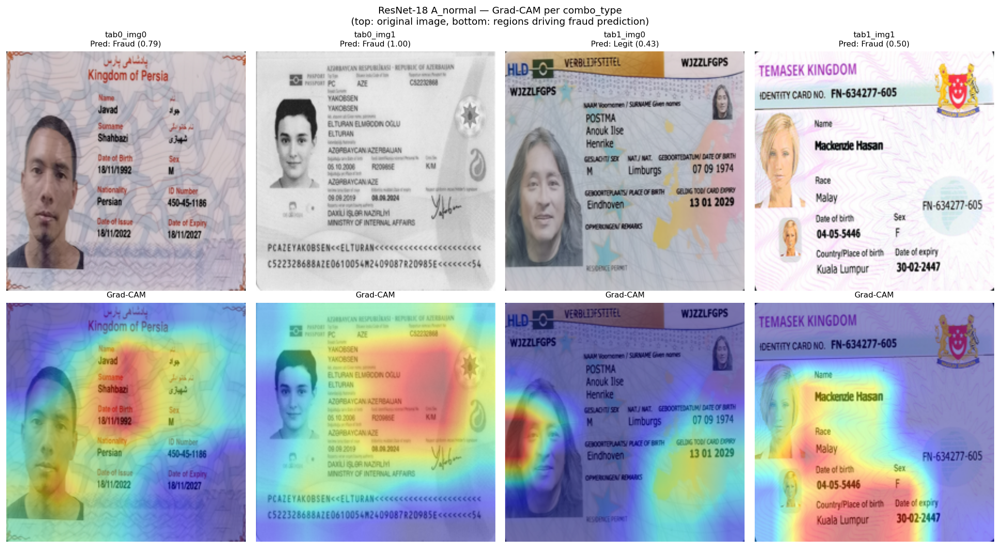

In [17]:
# Generate Grad-CAM for one example per combo_type
fig, axes = plt.subplots(2, len(combo_examples), figsize=(4*len(combo_examples), 9))
combo_types = list(combo_examples.keys())

for col, combo in enumerate(combo_types):
    img_path = combo_examples[combo][0]
    try:
        tensor, orig_img = load_image_tensor(img_path)

        with torch.enable_grad():
            cam = gradcam_resnet.generate(tensor)

        prob = torch.sigmoid(model_resnet(tensor)).item()
        pred_label = "Fraud" if prob >= 0.5 else "Legit"

        axes[0, col].imshow(orig_img.resize((224, 224)))
        axes[0, col].set_title(combo + "\nPred: " + pred_label + f" ({prob:.2f})", fontsize=9)
        axes[0, col].axis("off")

        overlay = overlay_heatmap(orig_img, cam)
        axes[1, col].imshow(overlay)
        axes[1, col].set_title("Grad-CAM", fontsize=9)
        axes[1, col].axis("off")

    except Exception as e:
        axes[0, col].text(0.5, 0.5, "Error: " + str(e)[:40],
                          ha="center", va="center", transform=axes[0, col].transAxes, fontsize=7)
        axes[0, col].axis("off")
        axes[1, col].axis("off")

fig.suptitle("ResNet-18 A_normal — Grad-CAM per combo_type\n"
             "(top: original image, bottom: regions driving fraud prediction)",
             fontsize=11)
fig.tight_layout()
fig.savefig(R_NB / "gradcam_resnet18_combos.png", dpi=150, bbox_inches="tight")
plt.show()

## 2.3 Grad-CAM — EfficientNet-B0 image-only

In [18]:
from efficientnet_utils import build_model as build_effnet

model_effnet = build_effnet(pretrained=False, freeze_backbone=False, dropout=0.4).to(device)
model_effnet.load_state_dict(
    torch.load(R_NB / "mm_image_efficientnet_b0" / "A_weighted" / "stage2_best.pt",
               map_location=device))
model_effnet.eval()

# EfficientNet-B0 last conv layer: features[-1] (MBConv block)
gradcam_effnet = GradCAM(model_effnet, model_effnet.features[-1])
print("EfficientNet-B0 Grad-CAM ready. Target layer: features[-1]")


EfficientNet-B0 | image_size=224 | in_features=1280 | dropout=0.4
EfficientNet-B0 Grad-CAM ready. Target layer: features[-1]


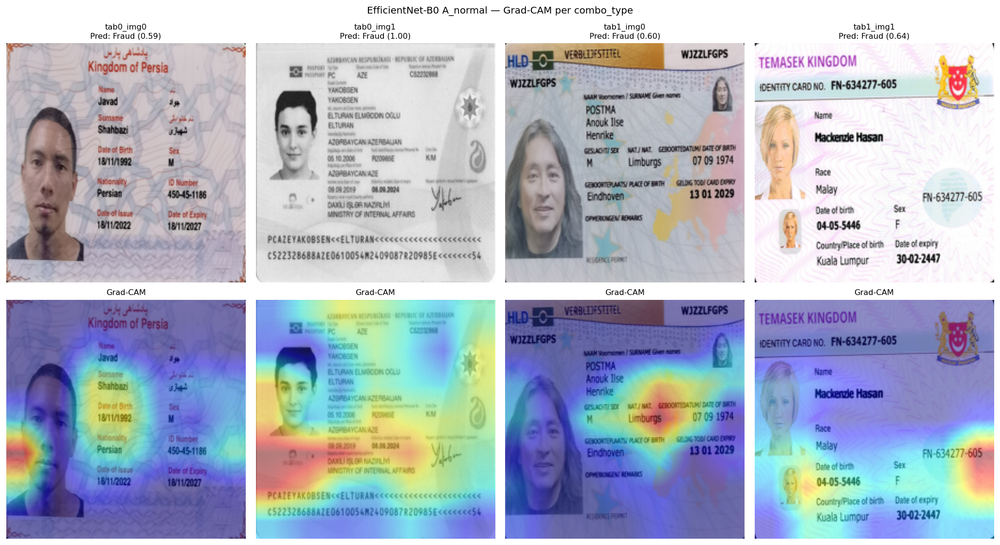

In [19]:
fig, axes = plt.subplots(2, len(combo_examples), figsize=(4*len(combo_examples), 9))

for col, combo in enumerate(combo_types):
    img_path = combo_examples[combo][0]
    try:
        tensor, orig_img = load_image_tensor(img_path)
        with torch.enable_grad():
            cam = gradcam_effnet.generate(tensor)
        prob = torch.sigmoid(model_effnet(tensor)).item()
        pred_label = "Fraud" if prob >= 0.5 else "Legit"

        axes[0, col].imshow(orig_img.resize((224, 224)))
        axes[0, col].set_title(f"{combo}\nPred: {pred_label} ({prob:.2f})", fontsize=9)
        axes[0, col].axis("off")

        overlay = overlay_heatmap(orig_img, cam)
        axes[1, col].imshow(overlay)
        axes[1, col].set_title("Grad-CAM", fontsize=9)
        axes[1, col].axis("off")
    except Exception as e:
        for ax in [axes[0,col], axes[1,col]]:
            ax.text(0.5, 0.5, str(e)[:40], ha="center", transform=ax.transAxes, fontsize=7)
            ax.axis("off")

fig.suptitle("EfficientNet-B0 A_normal — Grad-CAM per combo_type", fontsize=11)
fig.tight_layout()
fig.savefig(R_NB / "gradcam_effnet_combos.png", dpi=150, bbox_inches="tight")
plt.show()


## 2.4 Grad-CAM — tab1_img0 deep dive (transaction fraud, legitimate-looking image)

This is the key diagnostic subgroup. An image-only model must detect fraud from an
image that does not look fraudulent — the prediction is driven entirely by spurious
visual patterns or by the model's uncertainty rather than genuine fraud evidence.


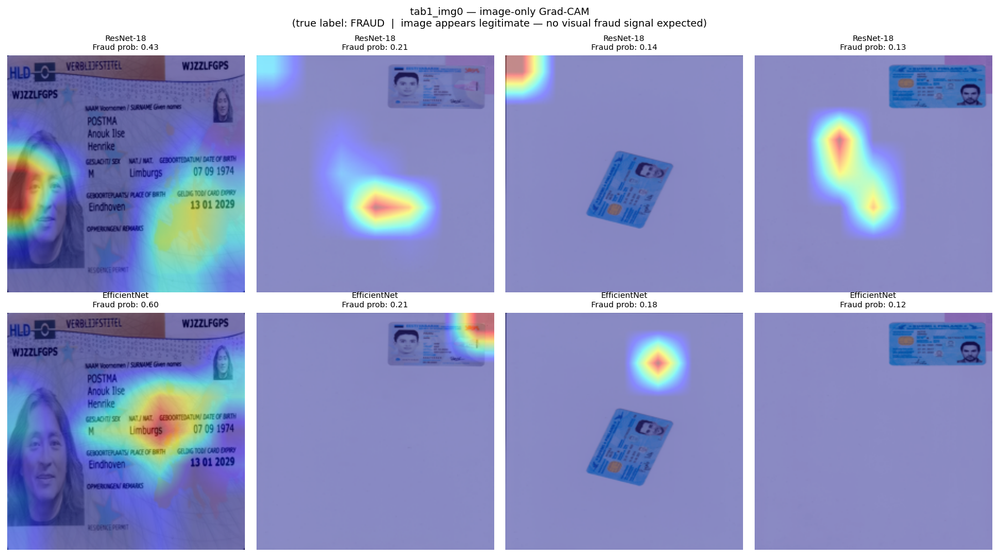

In [20]:
tab1_img0_paths = combo_examples.get("tab1_img0", [])
n_examples = min(6, len(tab1_img0_paths))

if n_examples > 0:
    fig, axes = plt.subplots(2, n_examples, figsize=(3.5*n_examples, 8))
    if n_examples == 1: axes = axes.reshape(2,1)

    for col, img_path in enumerate(tab1_img0_paths[:n_examples]):
        try:
            tensor, orig_img = load_image_tensor(img_path)

            with torch.enable_grad():
                cam_r = gradcam_resnet.generate(tensor)
                cam_e = gradcam_effnet.generate(tensor)

            prob_r = torch.sigmoid(model_resnet(tensor)).item()
            prob_e = torch.sigmoid(model_effnet(tensor)).item()

            axes[0, col].imshow(overlay_heatmap(orig_img, cam_r))
            axes[0, col].set_title(f"ResNet-18\nFraud prob: {prob_r:.2f}", fontsize=8)
            axes[0, col].axis("off")

            axes[1, col].imshow(overlay_heatmap(orig_img, cam_e))
            axes[1, col].set_title(f"EfficientNet\nFraud prob: {prob_e:.2f}", fontsize=8)
            axes[1, col].axis("off")
        except Exception as e:
            for ax in [axes[0,col], axes[1,col]]:
                ax.text(0.5,0.5,str(e)[:30],ha="center",transform=ax.transAxes,fontsize=7)
                ax.axis("off")

    fig.suptitle("tab1_img0 — image-only Grad-CAM\n"
                 "(true label: FRAUD  |  image appears legitimate — no visual fraud signal expected)",
                 fontsize=10)
    fig.tight_layout()
    fig.savefig(R_NB / "gradcam_tab1_img0_image_only.png", dpi=150, bbox_inches="tight")
    plt.show()
else:
    print("No tab1_img0 examples found in test set paths.")


---
## 2.5 Grad-CAM — Multimodal ResNet-18 (image branch within fusion model)

For the multimodal model, Grad-CAM is applied to the image backbone *within* the
fusion architecture. This shows which image regions the model attends to when making
a fusion prediction — where the tabular branch also contributes to the final logit.


In [21]:
from multimodal_utils import (
    MultimodalFraudDetector, TAB_ALL_FE,
    fit_scaler, build_dataloaders, engineer_features as mm_engineer,
)

# Load multimodal ResNet-18 C_fe_normal
model_mm_resnet = MultimodalFraudDetector(
    backbone="resnet18", tab_input_dim=len(TAB_ALL_FE), pretrained=False).to(device)
model_mm_resnet.load_state_dict(
    torch.load(R_NB / "mm_deep_resnet18" / "C_fe_normal" / "stage2_best.pt",
               map_location=device))
model_mm_resnet.eval()

# ── Find the last Conv2d inside the image branch ──────────────────────────────
# Works regardless of how the backbone is internally wrapped
target_layer = None
target_name  = None
for name, mod in model_mm_resnet.named_modules():
    # Only consider layers that are part of the image backbone
    if "image_backbone" in name and isinstance(mod, torch.nn.Conv2d):
        target_layer = mod
        target_name  = name

if target_layer is None:
    # Fallback: last Conv2d in the whole model
    for name, mod in model_mm_resnet.named_modules():
        if isinstance(mod, torch.nn.Conv2d):
            target_layer = mod
            target_name  = name

print(f"Grad-CAM target layer: {target_name}")
gradcam_mm_resnet = GradCAM(model_mm_resnet, target_layer)
print("Multimodal ResNet-18 Grad-CAM ready.")

MultimodalFraudDetector | backbone=resnet18 | tab_dim=12 | fusion_dim=256 | params=11,409,857
Grad-CAM target layer: image_backbone.7.1.conv2
Multimodal ResNet-18 Grad-CAM ready.


In [22]:
# Prepare tabular features for multimodal inference
train_mm_raw = pd.read_csv(DATA_DIR / "mm_train_mixed_all_group_test.csv")
train_mm_fe  = mm_engineer(train_mm_raw)
test_mm_fe_df = mm_engineer(test_df_raw)

scaler_fe = fit_scaler(train_mm_fe, TAB_ALL_FE)

def get_tab_tensor(row_df):
    """Convert a single row to scaled tabular tensor."""
    import torch
    from sklearn.preprocessing import StandardScaler
    vals = scaler_fe.transform(row_df[TAB_ALL_FE].values.reshape(1, -1))
    return torch.tensor(vals, dtype=torch.float32).to(device)

print("Tabular scaler ready.")


Feature validation passed — 12 features, no leakage.
Scaler fitted on 12 features: ['tab_type', 'tab_amount', 'tab_oldbalanceOrg', 'tab_newbalanceOrig', 'tab_oldbalanceDest', 'tab_newbalanceDest', 'tab_isFlaggedFraud', 'tab_balance_delta_orig', 'tab_balance_delta_dest', 'tab_amount_ratio_orig', 'tab_amount_ratio_dest', 'tab_orig_balance_zeroed']
Tabular scaler ready.


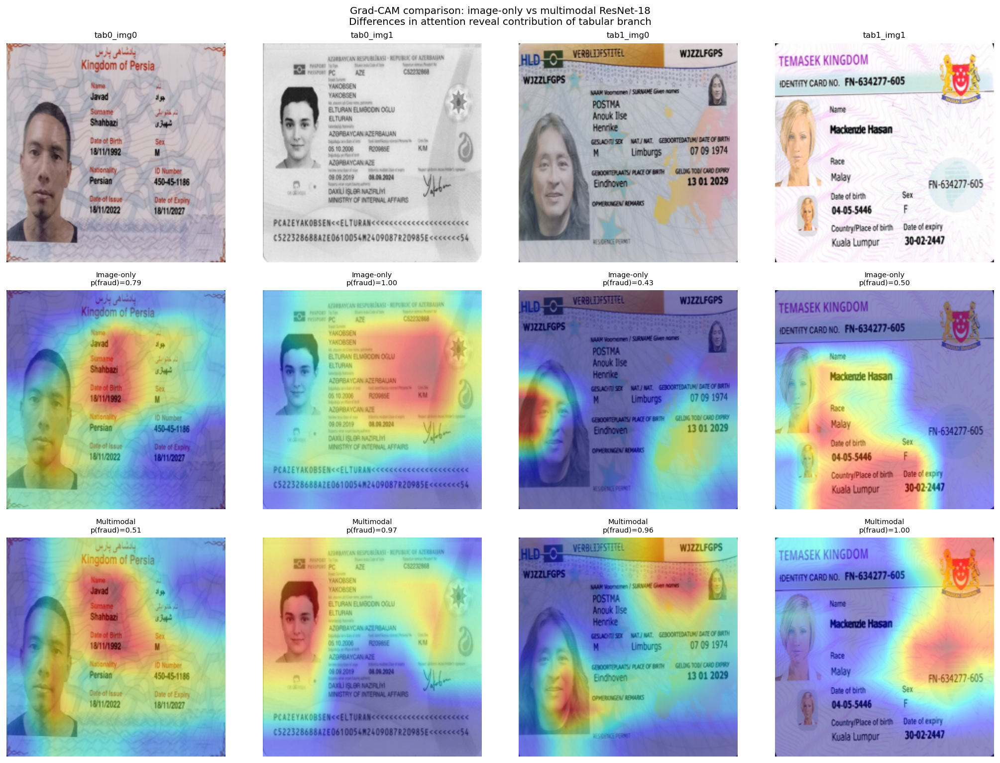

In [23]:
# Grad-CAM for multimodal model — requires both image and tabular input
def mm_gradcam(model, gradcam_obj, img_tensor, tab_tensor):
    """
    Run forward+backward for multimodal model to generate Grad-CAM.
    Both img_tensor and tab_tensor must be on device.
    """
    model.eval()
    out = model(img_tensor, tab_tensor)
    model.zero_grad()
    out.squeeze().backward()

    weights = gradcam_obj.gradients.mean(dim=[2, 3], keepdim=True)
    cam = (weights * gradcam_obj.activations).sum(dim=1, keepdim=True)
    cam = F.relu(cam).squeeze().cpu().numpy()
    import cv2
    cam = cv2.resize(cam, (224, 224))
    cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
    return cam

# Generate comparison: image-only vs multimodal Grad-CAM for same images
fig, axes = plt.subplots(3, len(combo_types), figsize=(4*len(combo_types), 12))

for col, combo in enumerate(combo_types):
    img_path = combo_examples[combo][0]
    try:
        tensor, orig_img = load_image_tensor(img_path)

        # Find matching row in test_mm_fe_df
        row_candidates = test_mm_fe_df[test_mm_fe_df["img_image_path"] == img_path]
        if row_candidates.empty:
            for ax in axes[:, col]: ax.axis("off")
            continue

        tab_t = get_tab_tensor(row_candidates.iloc[[0]])

        # Image-only ResNet Grad-CAM
        with torch.enable_grad():
            cam_img = gradcam_resnet.generate(tensor)

        # Multimodal ResNet Grad-CAM
        with torch.enable_grad():
            cam_mm = mm_gradcam(model_mm_resnet, gradcam_mm_resnet, tensor, tab_t)

        prob_img = torch.sigmoid(model_resnet(tensor)).item()
        prob_mm  = torch.sigmoid(model_mm_resnet(tensor, tab_t)).item()

        # Row 0: original image
        axes[0, col].imshow(orig_img.resize((224, 224)))
        axes[0, col].set_title(f"{combo}", fontsize=9)
        axes[0, col].axis("off")

        # Row 1: image-only Grad-CAM
        axes[1, col].imshow(overlay_heatmap(orig_img, cam_img))
        axes[1, col].set_title(f"Image-only\np(fraud)={prob_img:.2f}", fontsize=8)
        axes[1, col].axis("off")

        # Row 2: multimodal Grad-CAM
        axes[2, col].imshow(overlay_heatmap(orig_img, cam_mm))
        axes[2, col].set_title(f"Multimodal\np(fraud)={prob_mm:.2f}", fontsize=8)
        axes[2, col].axis("off")

    except Exception as e:
        for ax in axes[:, col]:
            ax.text(0.5, 0.5, str(e)[:35], ha="center", transform=ax.transAxes, fontsize=7)
            ax.axis("off")

axes[0, 0].set_ylabel("Original", fontsize=9)
axes[1, 0].set_ylabel("Image-only", fontsize=9)
axes[2, 0].set_ylabel("Multimodal", fontsize=9)

fig.suptitle("Grad-CAM comparison: image-only vs multimodal ResNet-18\n"
             "Differences in attention reveal contribution of tabular branch",
             fontsize=11)
fig.tight_layout()
fig.savefig(R_NB / "gradcam_comparison_image_vs_multimodal.png", dpi=150, bbox_inches="tight")
plt.show()


### Interpreting the comparison

For `tab1_img0` (row 3, transaction fraud, legitimate-looking image):
- **Image-only model**: Grad-CAM may show diffuse or scattered attention — the model
  has no reliable visual signal and may focus on spurious patterns.
- **Multimodal model**: Grad-CAM may show similarly diffuse image attention, but the
  model's fraud probability should be much higher because the tabular branch provides
  the fraud signal. The image branch need not carry the detection burden.

This contrast illustrates the complementarity of the two modalities: the fusion model
delegates to the appropriate branch depending on which modality contains informative signal.


---
## Summary

| Analysis | Key finding |
|---|---|
| SHAP XGBoost PaySim | `balance_delta_orig` and `orig_balance_zeroed` are the dominant features — confirming the account-draining mechanism |
| SHAP XGBoost MM | Feature importance pattern shifts on smaller dataset — amount and balance features remain important |
| SHAP LR vs XGBoost | LR shows smoother, more linear feature effects; XGBoost captures non-linear interactions |
| Grad-CAM image-only | Model attends to document structure features; for tab1_img0 images attention is diffuse |
| Grad-CAM multimodal | Image attention patterns are similar but the fraud probability for tab1_img0 is correctly high — tabular branch carries the detection signal |


The left chart shows cumulative cost as each transaction is processed. The green line (cost-tuned) stays below the orange line (default) because the tuned threshold catches more frauds early — every missed fraud adds $50K in one step while every false alarm adds only $500. The shaded green area between the two lines is the total money saved by threshold tuning.
The right chart shows the final totals as a bar chart — the clearest summary for a thesis figure.